<img align="right" src="https://www.tedu.edu.tr/themes/custom/tedu/logo.svg" width="350px" height="350px"/>
<h1 style="font-size:20pt">ADS 575 Applied Testing for Data Science - Final Exam </h1><br/>
<b> Prepared by: </b> Şeyma Gülşen Akkuş <br/>
<b> Date: </b>28.03.2025<br/>

## Overview

This Jupyter Notebook presents a comprehensive analysis of employee salary data provided by Monsanto (acquired by Bayer), on behalf of ICL. The aim is to identify the key factors influencing salaries, evaluate departmental differences, and provide actionable recommendations for salary policy optimization. 

The dataset includes demographic, educational, and professional details of 250,000 employees. Using statistical analysis, visualizations, and machine learning models, we explore salary distribution, departmental disparities, potential biases, and derive data-driven insights for HR strategy development.


## 📑 Table of Contents

1. [Introduction](#introduction)
2. [Data Loading & Preliminary Exploration](#data-loading--preliminary-exploration)
3. [Data Cleaning & Preprocessing](#data-cleaning--preprocessing)
4. [Exploratory Data Analysis (EDA)](#exploratory-data-analysis-eda)
    - 4.1 [Salary Distribution](#salary-distribution)
    - 4.2 [Demographic Analysis](#demographic-analysis)
    - 4.3 [Job and Department Insights](#job-and-department-insights)
5. [Salary Driver Analysis](#salary-driver-analysis)
    - 5.1 [Correlation Analysis](#correlation-analysis)
    - 5.2 [Feature Importance (ML Model)](#feature-importance-ml-model)
6. [Department-wise Budget and Salary Analysis](#department-wise-budget-and-salary-analysis)
7. [Bias & Fairness Assessment](#bias--fairness-assessment)
8. [Conclusion & Recommendations](#conclusion--recommendations)


## 1.  Introduction

This project focuses on the analysis of employee salary data from a company formerly known as Monsanto, now operating under Bayer. The data was provided by ICL Group to investigate internal salary structures and gain competitive insights against key industry players such as Nutrien, Yara, CF, BASF, and others.

The primary goal of this analysis is to identify patterns, disparities, and key influencers in the salary distribution among employees. Specifically, the analysis aims to answer the following central questions:

- **What are the most influential factors affecting employee salaries?**
- **Are there significant differences in salary distribution between departments?**
- **Is there any evidence of bias or inequality in salary allocation across gender, marital status, or profession?**
- **What actionable recommendations can be made to optimize salary strategy and maintain competitiveness in the industry?**

The dataset includes variables such as age, education, profession, job title, department, tenure, and salary. The analysis will be performed using Python and consists of data cleaning, exploratory analysis, statistical modeling, and data-driven interpretation. The final output will not only provide insight into the internal compensation structure but also help benchmark practices with competitors in the fertilizer and chemical industry.

This study was conducted as part of the final assessment for the **ADS 575: Applied Testing for Data Science** course, under real-world industry simulation constraints. All analysis and interpretations are documented in this notebook as per the assignment requirements.


## 2. Data Loading & Preliminary Exploration

In this section, we will load the dataset and perform an initial exploration to understand the structure of the data. We will check the data types, shape, presence of missing values, and preview the content of the dataset.


In [432]:
#Libraries

# Modules
import os
import sys
import re
import datetime

# Data Processing Libraries
import pandas as pd         # for data handling
import numpy as np          # for numerical operations
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, root_mean_squared_error
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

# Data Visualization Libraries
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
import dash
import pylab
import scipy.stats as st
import matplotlib.pyplot as plt
from itertools import combinations

#Corellation Matrix
import plotly.express as px

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)
pd.set_option('display.width', 1500) 

# Statistics Libraries
from scipy import stats as st
from scipy.stats import binom
from scipy.stats import poisson
from scipy.stats import norm
from scipy.stats import chi2_contingency
from scipy import linalg
import scikit_posthocs as sp
from scipy.stats import kruskal
from scipy.stats import shapiro

# Jupyter enhancements
from IPython.display import display, HTML

# Plot settings
sns.set_context('notebook')          # good size for notebooks
sns.set_style('darkgrid')            # background style
sns.set_palette('Set2')              # soft color palette

In [3]:
# Load the dataset
data = pd.read_csv("employees_data.csv")
del data['Unnamed: 0']
data

,id,Birth Year,Marital Status,Sex,Degree,Profesion,Job,Department,Years of Education,Years in the Company,Salary
0,6899820194610401,1977,Single,Female,MS,Chemist,Researcher,Product,18,2,153000
1,6309186934451336,1943,Married,Male,Assistant Professor,MD,Director,Product,17,12,175500
2,1907571712084146,1953,Single,Male,Postdoc,Developer,Director,R&D,33,7,280500
3,9259518702778808,1978,Single,Male,Postdoc,Physicist,Technician,R&D,26,20,267000
4,8046439793341844,1976,Single,Male,Postdoc,Agronomist,Technician,Product,20,15,207000
...,...,...,...,...,...,...,...,...,...,...,...
249995,5850242870043682,1935,Single,Male,MS,Bilogist,Manager,R&D,20,10,192000
249996,3161975337894773,1952,Single,Male,Assistant Professor,Chemist,Scientist,Quality,33,8,283500
249997,4710070731993885,1960,Single,Female,BSc,Chemist,Scientist,R&D,34,4,279000
249998,6179893491740079,1946,Single,Female,Postdoc,Engineer,Director,R&D,36,3,291000


In [5]:
# Basic info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   id                    250000 non-null  int64 
 1   Birth Year            250000 non-null  int64 
 2   Marital Status        250000 non-null  object
 3   Sex                   250000 non-null  object
 4   Degree                250000 non-null  object
 5   Profesion             250000 non-null  object
 6   Job                   250000 non-null  object
 7   Department            250000 non-null  object
 8   Years of Education    250000 non-null  int64 
 9   Years in the Company  250000 non-null  int64 
 10  Salary                250000 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 21.0+ MB


In [7]:
# Summary statistics for numeric columns
data.describe()

,id,Birth Year,Years of Education,Years in the Company,Salary
count,2.500000e+05,250000.000000,250000.000000,250000.000000,250000.000000
mean,5.912956e+15,1958.841868,27.013488,10.507188,246122.724000
std,2.359533e+15,15.101214,7.212638,5.762311,56795.246523
min,1.827676e+15,1933.000000,15.000000,1.000000,127500.000000
25%,3.873033e+15,1946.000000,21.000000,6.000000,199500.000000
50%,5.916615e+15,1959.000000,27.000000,11.000000,246000.000000
75%,7.952407e+15,1972.000000,33.000000,16.000000,292500.000000
max,9.999996e+15,1985.000000,39.000000,20.000000,364500.000000


In [9]:
# Check for missing values
data.isnull().sum()

id                      0
Birth Year              0
Marital Status          0
Sex                     0
Degree                  0
Profesion               0
Job                     0
Department              0
Years of Education      0
Years in the Company    0
Salary                  0
dtype: int64

## 3. Data Cleaning & Preprocessing

In this section, we clean and preprocess the dataset to prepare it for analysis. The dataset appears well-structured with no missing values, but some issues such as misspelled column names, feature engineering opportunities, and inconsistent category values will be addressed.

In [56]:
df = data.copy()
df

,id,Birth Year,Marital Status,Sex,Degree,Profesion,Job,Department,Years of Education,Years in the Company,Salary
0,6899820194610401,1977,Single,Female,MS,Chemist,Researcher,Product,18,2,153000
1,6309186934451336,1943,Married,Male,Assistant Professor,MD,Director,Product,17,12,175500
2,1907571712084146,1953,Single,Male,Postdoc,Developer,Director,R&D,33,7,280500
3,9259518702778808,1978,Single,Male,Postdoc,Physicist,Technician,R&D,26,20,267000
4,8046439793341844,1976,Single,Male,Postdoc,Agronomist,Technician,Product,20,15,207000
...,...,...,...,...,...,...,...,...,...,...,...
249995,5850242870043682,1935,Single,Male,MS,Bilogist,Manager,R&D,20,10,192000
249996,3161975337894773,1952,Single,Male,Assistant Professor,Chemist,Scientist,Quality,33,8,283500
249997,4710070731993885,1960,Single,Female,BSc,Chemist,Scientist,R&D,34,4,279000
249998,6179893491740079,1946,Single,Female,Postdoc,Engineer,Director,R&D,36,3,291000


In [58]:
df['id'].nunique()

250000

In [60]:
# Drop ID (not useful for analysis)
df.drop(columns=['id'], inplace=True)
df

,Birth Year,Marital Status,Sex,Degree,Profesion,Job,Department,Years of Education,Years in the Company,Salary
0,1977,Single,Female,MS,Chemist,Researcher,Product,18,2,153000
1,1943,Married,Male,Assistant Professor,MD,Director,Product,17,12,175500
2,1953,Single,Male,Postdoc,Developer,Director,R&D,33,7,280500
3,1978,Single,Male,Postdoc,Physicist,Technician,R&D,26,20,267000
4,1976,Single,Male,Postdoc,Agronomist,Technician,Product,20,15,207000
...,...,...,...,...,...,...,...,...,...,...
249995,1935,Single,Male,MS,Bilogist,Manager,R&D,20,10,192000
249996,1952,Single,Male,Assistant Professor,Chemist,Scientist,Quality,33,8,283500
249997,1960,Single,Female,BSc,Chemist,Scientist,R&D,34,4,279000
249998,1946,Single,Female,Postdoc,Engineer,Director,R&D,36,3,291000


In [62]:
# Rename the misspelled column
df.rename(columns={'Profesion': 'Profession'}, inplace=True)
df

,Birth Year,Marital Status,Sex,Degree,Profession,Job,Department,Years of Education,Years in the Company,Salary
0,1977,Single,Female,MS,Chemist,Researcher,Product,18,2,153000
1,1943,Married,Male,Assistant Professor,MD,Director,Product,17,12,175500
2,1953,Single,Male,Postdoc,Developer,Director,R&D,33,7,280500
3,1978,Single,Male,Postdoc,Physicist,Technician,R&D,26,20,267000
4,1976,Single,Male,Postdoc,Agronomist,Technician,Product,20,15,207000
...,...,...,...,...,...,...,...,...,...,...
249995,1935,Single,Male,MS,Bilogist,Manager,R&D,20,10,192000
249996,1952,Single,Male,Assistant Professor,Chemist,Scientist,Quality,33,8,283500
249997,1960,Single,Female,BSc,Chemist,Scientist,R&D,34,4,279000
249998,1946,Single,Female,Postdoc,Engineer,Director,R&D,36,3,291000


In [64]:
# Create a new column for Age
df["Age"] = 2025 - df["Birth Year"]
df

,Birth Year,Marital Status,Sex,Degree,Profession,Job,Department,Years of Education,Years in the Company,Salary,Age
0,1977,Single,Female,MS,Chemist,Researcher,Product,18,2,153000,48
1,1943,Married,Male,Assistant Professor,MD,Director,Product,17,12,175500,82
2,1953,Single,Male,Postdoc,Developer,Director,R&D,33,7,280500,72
3,1978,Single,Male,Postdoc,Physicist,Technician,R&D,26,20,267000,47
4,1976,Single,Male,Postdoc,Agronomist,Technician,Product,20,15,207000,49
...,...,...,...,...,...,...,...,...,...,...,...
249995,1935,Single,Male,MS,Bilogist,Manager,R&D,20,10,192000,90
249996,1952,Single,Male,Assistant Professor,Chemist,Scientist,Quality,33,8,283500,73
249997,1960,Single,Female,BSc,Chemist,Scientist,R&D,34,4,279000,65
249998,1946,Single,Female,Postdoc,Engineer,Director,R&D,36,3,291000,79


In [66]:
# Check unique values in categorical columns for consistency
categorical_cols = ["Marital Status", "Sex", "Degree", "Profession", "Job", "Department"]
for col in categorical_cols:
    print(f"{col}: {df[col].unique()}")

Marital Status: ['Single' 'Married']
Sex: ['Female' 'Male']
Degree: ['MS' 'Assistant Professor' 'Postdoc' 'PhD' 'BSc']
Profession: ['Chemist' 'MD' 'Developer' 'Physicist' 'Agronomist' 'Pharmacist'
 'Mathematician' 'Neuroscientist' 'Economist' 'Engineer' 'Bilogist']
Job: ['Researcher' 'Director' 'Technician' 'Manager' 'Scientist']
Department: ['Product' 'R&D' 'Quality' 'Operations']


In [68]:
# Fix typo in Profession
df['Profession'] = df['Profession'].replace({'Bilogist': 'Biologist'})

In [70]:
df['Profession'].unique()

array(['Chemist', 'MD', 'Developer', 'Physicist', 'Agronomist',
       'Pharmacist', 'Mathematician', 'Neuroscientist', 'Economist',
       'Engineer', 'Biologist'], dtype=object)

In [72]:
# Convert categorical columns to category dtype
for col in ["Marital Status", "Sex", "Degree", "Profession", "Job", "Department"]:
    df[col] = df[col].astype('category')

In [74]:
# Display value counts for each categorical column
for col in categorical_cols:
    print(f"\n=== {col} ===")
    print(df[col].value_counts())



=== Marital Status ===
Marital Status
Married    125040
Single     124960
Name: count, dtype: int64

=== Sex ===
Sex
Female    125250
Male      124750
Name: count, dtype: int64

=== Degree ===
Degree
Assistant Professor    50187
PhD                    50106
Postdoc                49978
MS                     49892
BSc                    49837
Name: count, dtype: int64

=== Profession ===
Profession
Biologist         22934
Pharmacist        22916
Agronomist        22906
Mathematician     22898
Engineer          22732
MD                22730
Neuroscientist    22701
Physicist         22691
Developer         22619
Economist         22537
Chemist           22336
Name: count, dtype: int64

=== Job ===
Job
Scientist     82993
Researcher    41886
Technician    41768
Director      41753
Manager       41600
Name: count, dtype: int64

=== Department ===
Department
R&D           124890
Operations     41924
Product        41645
Quality        41541
Name: count, dtype: int64


> ⚠️ **Observation: Job and Department Imbalance**

- The distribution of employees across **jobs** is not uniform:
    - `Scientist`: 83,000+ employees
    - Other roles (e.g., `Manager`, `Technician`, `Director`): ~41,000 each
- Similarly, the **'R&D' department** has more than 124,000 employees, while others have ~41,000 each.

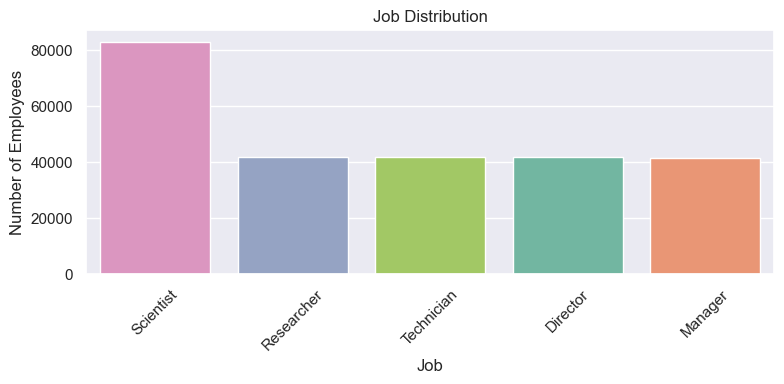

In [84]:
# Plot Job distribution
plt.figure(figsize=(8, 4))
sns.countplot(data=df, x='Job', hue='Job', palette='Set2', legend=False,
              order=df['Job'].value_counts().index)
plt.title('Job Distribution')
plt.ylabel('Number of Employees')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

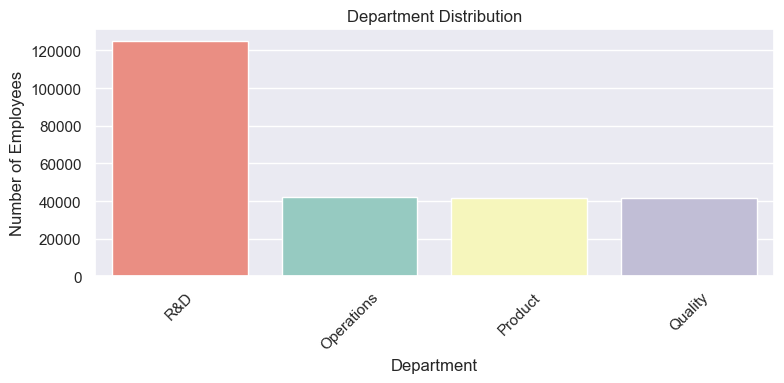

In [86]:
# Plot Department distribution
plt.figure(figsize=(8, 4))
sns.countplot(data=df, x='Department', hue='Department', palette='Set3', legend=False,
              order=df['Department'].value_counts().index)
plt.title('Department Distribution')
plt.ylabel('Number of Employees')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 4. Exploratory Data Analysis (EDA)

In this section, we explore the distribution and patterns of employee salaries in relation to demographic, educational, and organizational features. The goal is to uncover key insights that may explain salary differences and identify any irregularities or patterns worth investigating further.

### 4.1 Salary Distribution

First, we visualize the overall distribution of employee salaries to understand its spread, central tendency, and presence of outliers.

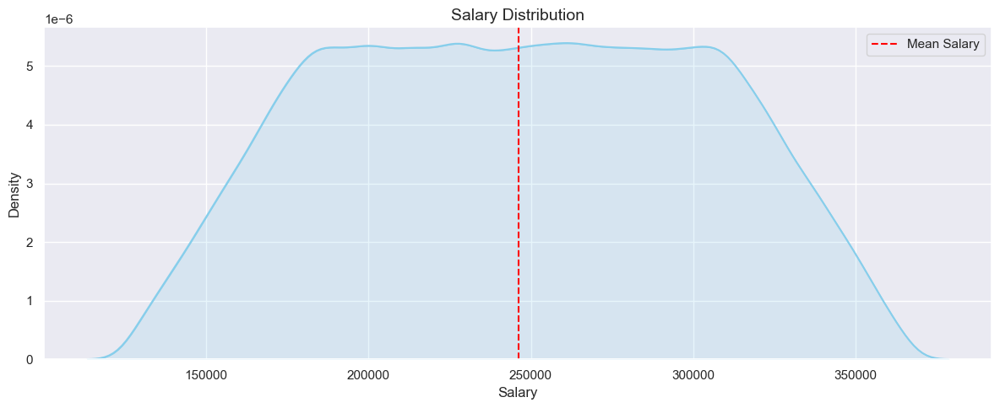

In [113]:
# Salary distribution with KDE plot and mean line
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False, color='skyblue')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, color='skyblue')
plt.axvline(df["Salary"].mean(), linestyle='--', color="red", label="Mean Salary")
plt.title("Salary Distribution", fontsize=14)
plt.xlabel("Salary")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

In [99]:
print(df["Salary"].describe())

count    250000.000000
mean     246122.724000
std       56795.246523
min      127500.000000
25%      199500.000000
50%      246000.000000
75%      292500.000000
max      364500.000000
Name: Salary, dtype: float64


> ℹ️ The salary ranges from **127,500 TL to 364,500 TL**, with a mean of approximately **246,122 TL**. The distribution is fairly symmetrical, as the mean and median are close.


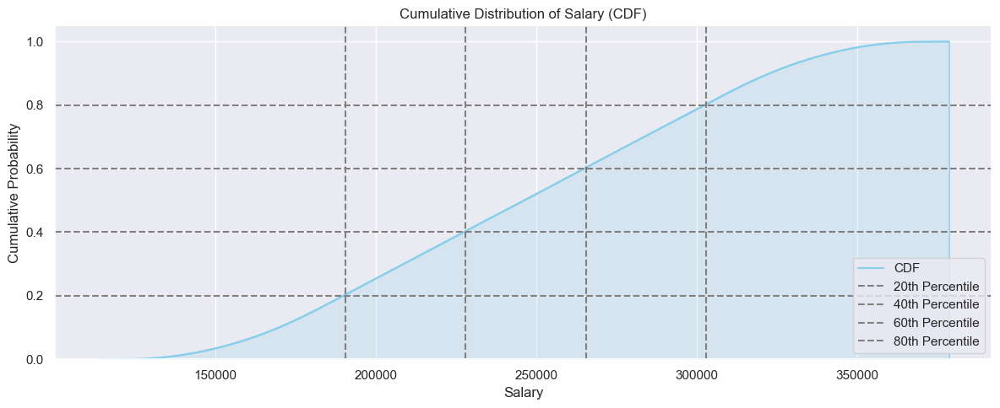

In [115]:
plt.figure(figsize=(12, 5))

# KDE CDF
sns.kdeplot(data=df, x="Salary", cumulative=True, fill=False, alpha=1, color='skyblue', label="CDF")
sns.kdeplot(data=df, x="Salary", cumulative=True, fill=True, alpha=0.2, color='skyblue')

# Quantile Lines with labels
plt.axhline(0.20, linestyle="--", color="gray", label="20th Percentile")
plt.axvline(df["Salary"].quantile(0.20), linestyle="--", color="gray")

plt.axhline(0.40, linestyle="--", color="gray", label="40th Percentile")
plt.axvline(df["Salary"].quantile(0.40), linestyle="--", color="gray")

plt.axhline(0.60, linestyle="--", color="gray", label="60th Percentile")
plt.axvline(df["Salary"].quantile(0.60), linestyle="--", color="gray")

plt.axhline(0.80, linestyle="--", color="gray", label="80th Percentile")
plt.axvline(df["Salary"].quantile(0.80), linestyle="--", color="gray")

plt.title("Cumulative Distribution of Salary (CDF)")
plt.xlabel("Salary")
plt.ylabel("Cumulative Probability")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()


In [117]:
df["Salary"].quantile(0.20),df["Salary"].quantile(0.40),df["Salary"].quantile(0.60),df["Salary"].quantile(0.80)

(190500.0, 228000.0, 265500.0, 303000.0)

> 📈 **Interpretation: Cumulative Salary Distribution**
>
> The cumulative distribution plot shows how employee salaries are spread across the population. Based on quantile values:
>
> - 20% of employees earn less than 190,500 TL
> - 40% of employees earn less than 228,000 TL
> - 60% of employees earn less than 265,500 TL
> - 80% of employees earn less than 303,000 TL
>


### 4.2 Demographic Analysis

In this section, we investigate whether salary levels vary significantly based on demographic attributes such as sex, marital status, age and etc. This is crucial to assess fairness and to identify any potential salary disparities across demographic groups.

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   Birth Year            250000 non-null  int64   
 1   Marital Status        250000 non-null  category
 2   Sex                   250000 non-null  category
 3   Degree                250000 non-null  category
 4   Profession            250000 non-null  category
 5   Job                   250000 non-null  category
 6   Department            250000 non-null  category
 7   Years of Education    250000 non-null  int64   
 8   Years in the Company  250000 non-null  int64   
 9   Salary                250000 non-null  int64   
 10  Age                   250000 non-null  int64   
dtypes: category(6), int64(5)
memory usage: 11.0 MB


#### A. Marital Status

In [143]:
df.groupby("Marital Status", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Marital Status,mean,median,min,max,sum,std,skew,sem,count,nunique
1,Single,246135.283291,246000.0,127500,364500,30757065000,56741.698986,0.000428,160.515445,124960,155
0,Married,246110.172745,246000.0,127500,364500,30773616000,56848.933535,0.000854,160.767345,125040,155


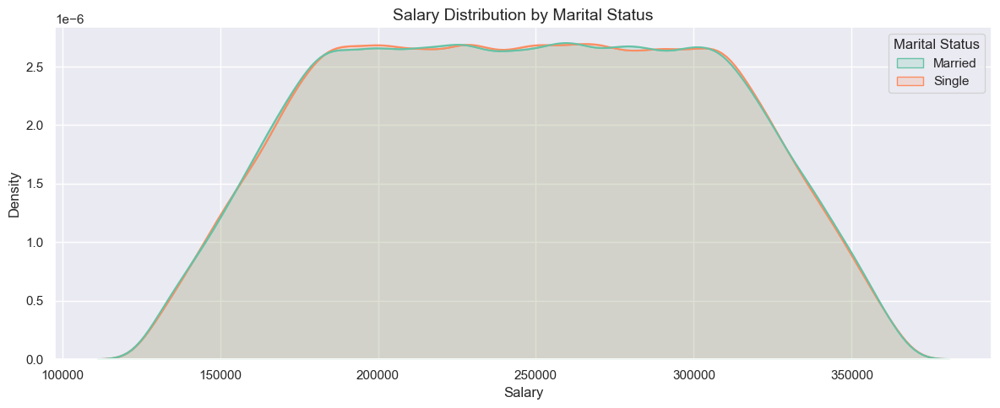

In [230]:
# Salary distribution by Marital Status with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False,hue='Marital Status')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Marital Status')
plt.title("Salary Distribution by Marital Status", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

> ✅ **Observation:** There is no meaningful difference in salaries between single and married employees. Both groups are nearly identical in size and salary statistics, indicating **no bias based on marital status**.

#### B. Sex

In [145]:
df.groupby("Sex", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Sex,mean,median,min,max,sum,std,skew,sem,count,nunique
0,Female,246386.035928,246000.0,127500,364500,30859851000,56743.217595,-0.006835,160.333802,125250,155
1,Male,245858.356713,246000.0,127500,364500,30670830000,56846.436512,0.008155,160.947031,124750,155


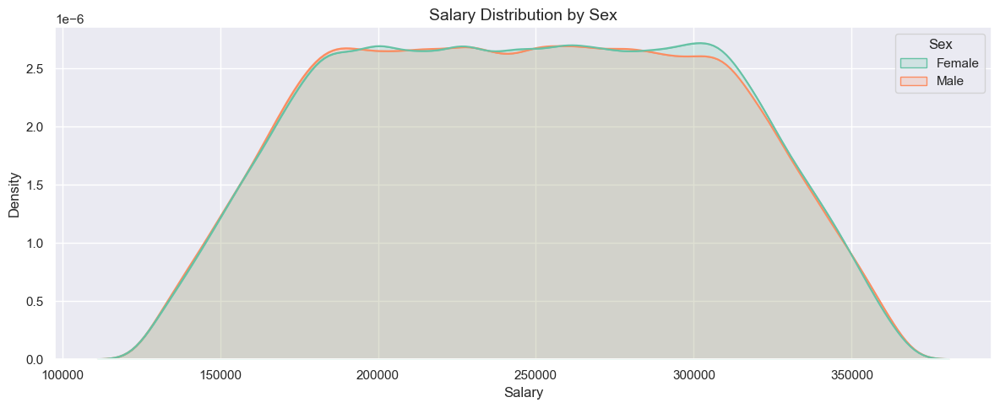

In [192]:
# Salary distribution by Sex with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False,hue='Sex')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Sex')
plt.title("Salary Distribution by Sex", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

> 🔍 **Observation:** Female employees earn slightly more on average (~528 TL), while the median salary is identical (246,000 TL) across genders. Although this suggests **no immediate evidence of pay discrimination against females**, the fact that their mean salary is higher **warrants deeper analysis**.
>
> Further investigation should compare:
> - Job and department distribution by gender
> - Years of experience and education
> - Representation in high-paying roles (e.g., Director)
>
> Without adjusting for these confounding variables, we cannot conclude the presence or absence of **systemic gender-based salary disparity**. The raw data only shows surface-level balance.


#### C. Degree

In [194]:
df.groupby("Degree", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Degree,mean,median,min,max,sum,std,skew,sem,count,nunique
3,PhD,246364.507245,246000.0,127500,364500,12344340000,56889.611479,-0.007689,254.148822,50106,155
4,Postdoc,246207.241186,246000.0,127500,364500,12304945500,56808.760180,-0.001059,254.112410,49978,155
0,Assistant Professor,246152.938012,246000.0,127500,364500,12353677500,56723.569720,-0.000895,253.202469,50187,155
1,BSc,246124.907197,246000.0,127500,364500,12266127000,56831.143343,-0.003113,254.571890,49837,155
2,MS,245762.667362,246000.0,127500,364500,12261591000,56723.548264,0.016016,253.949834,49892,155


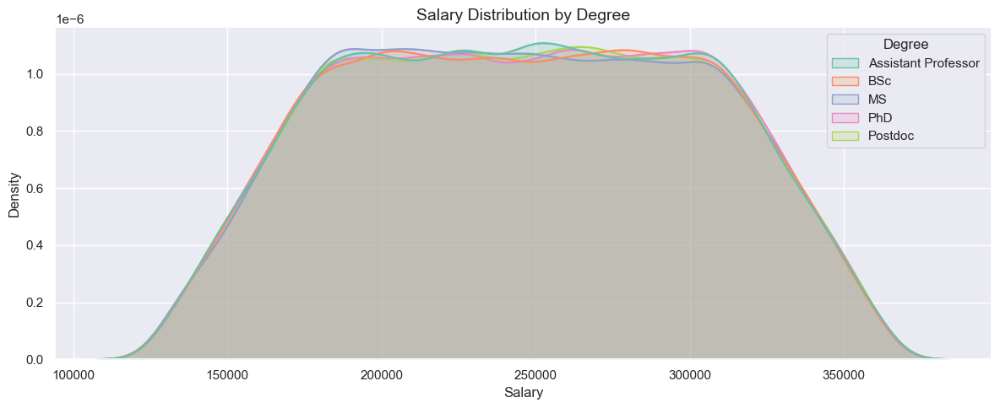

In [198]:
# Salary distribution by Degree with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False,hue='Degree')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Degree')
plt.title("Salary Distribution by Degree", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

> 📌 **Observation:** On the surface, salary differences between degree levels appear modest — PhD holders earn slightly more (~600 TL higher mean) than others. However, this **does not mean degree is unimportant**.
>
> To truly assess the influence of academic qualifications on salary, we should examine:
> - Whether **certain degrees are concentrated in higher-level roles** (e.g., Director, Manager)
> - Whether **years of education** (which strongly correlates with degree) explains this difference better
> - Interaction with **job type, department, and tenure**
>
> Without adjusting for these factors, we cannot definitively conclude the role of academic degree. A regression or feature importance analysis would help validate whether **degree independently contributes to salary**.


#### D. Profession

In [149]:
df.groupby("Profession", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Profession,mean,median,min,max,sum,std,skew,sem,count,nunique
5,Engineer,246440.986275,247500.0,127500,364500,5602096500,56781.588259,-0.006716,376.607281,22732,155
8,Neuroscientist,246359.587683,246000.0,127500,364500,5592609000,56752.235759,0.000441,376.669522,22701,155
2,Chemist,246225.510387,246000.0,127500,364500,5499693000,56681.919004,-0.011475,379.264195,22336,155
0,Agronomist,246207.783987,246000.0,127500,364500,5639635500,56896.198066,-0.001128,375.931414,22906,155
10,Physicist,246179.608655,246000.0,127500,364500,5586061500,56889.060989,0.003092,377.660834,22691,155
6,MD,246171.711395,246000.0,127500,364500,5595483000,56878.714713,-0.000671,377.268075,22730,155
4,Economist,246098.105338,246000.0,127500,364500,5546313000,56902.412464,0.009581,379.037891,22537,155
3,Developer,246059.949600,246000.0,127500,364500,5565630000,56504.060058,0.017375,375.701522,22619,155
1,Biologist,246042.447894,246000.0,127500,364500,5642737500,56554.889824,0.000017,373.448102,22934,155
7,Mathematician,245977.923836,246000.0,127500,364500,5632402500,57059.220311,-0.004688,377.074408,22898,155


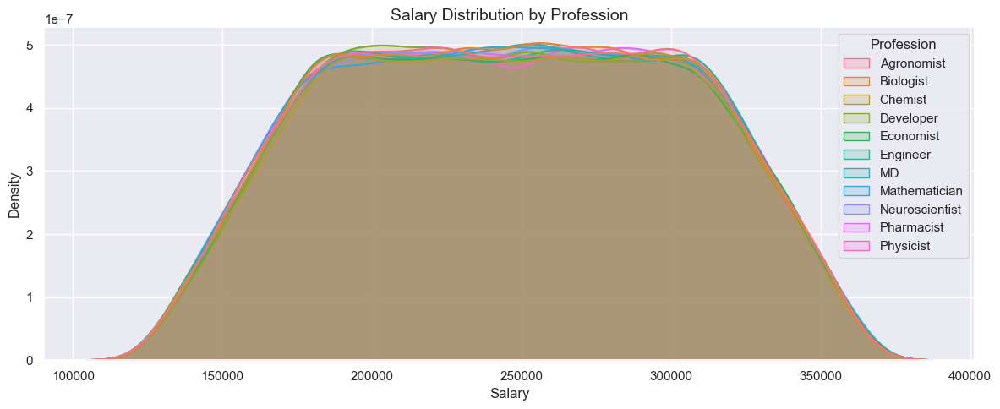

In [285]:
# Salary distribution by Profession with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False, hue='Profession')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Profession')
plt.title("Salary Distribution by Profession", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

> 📌 **Observation:** Despite covering a diverse range of professions (Engineer, Developer, MD, Economist, etc.), salary averages are remarkably close — all within ~850 TL of each other. 
>
> The **median salary is exactly the same (246,000 TL)** for all professions, and standard deviations are similar, indicating consistent salary bands across roles.
>
> This suggests that **"Profession" is not a strong determinant of salary** in this company. Instead, compensation may be more closely tied to other variables such as **Job title, Department, or Years in Company**.
>
> To validate this, further analysis should examine how profession interacts with job role (e.g., Engineer as Scientist vs as Technician) and department assignment.


#### E. Job

In [151]:
df.groupby("Job", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Job,mean,median,min,max,sum,std,skew,sem,count,nunique
0,Director,246485.138792,246000.0,127500,364500,10291494000,56748.691130,0.000351,277.723101,41753,155
2,Researcher,246325.275748,246000.0,127500,364500,10317580500,56758.885439,-0.010087,277.331637,41886,155
4,Technician,246145.589925,246000.0,127500,364500,10281009000,56885.225106,0.000904,278.341293,41768,155
3,Scientist,245933.524514,246000.0,127500,364500,20410761000,56798.907240,0.005698,197.160199,82993,155
1,Manager,245909.531250,246000.0,127500,364500,10229836500,56781.007361,0.001391,278.391793,41600,155


> ⚠️ **Observation:** While average salaries across job titles appear similar (~245,900–246,400 TL), there is a notable class imbalance: over **82,000 employees** are labeled as "Scientist", while other job roles have around 41,000 employees.
>
> This imbalance can skew overall salary statistics and models, making the data appear more stable or uniform than it truly is. 

In [176]:
# Get the minimum group size across all Job types
min_size = df["Job"].value_counts().min()

# Sample each Job group to match the smallest group size
df_balanced = df.groupby("Job", observed=True, group_keys=False).apply(
    lambda x: x.sample(min_size, random_state=42)
).reset_index(drop=True)

C:\Users\seyma\AppData\Local\Temp\ipykernel_31488\3376966693.py:5: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



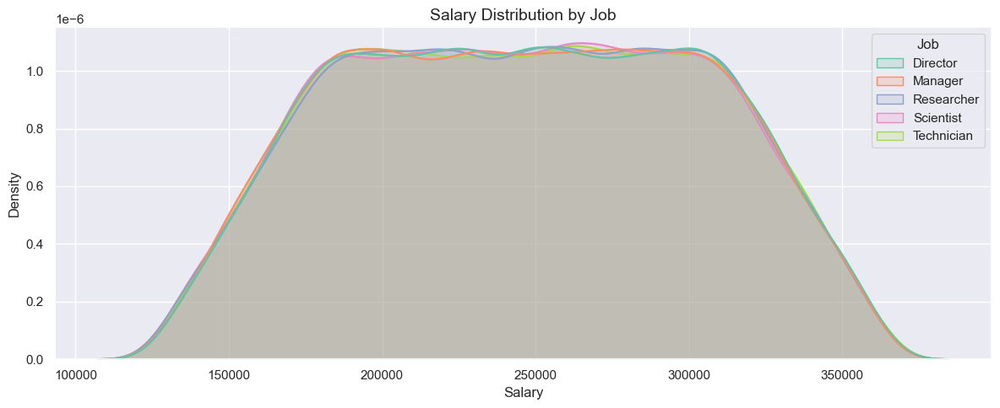

In [185]:
# Salary distribution by Job with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df_balanced, x="Salary", cumulative=False, alpha=1, fill=False,hue='Job')
sns.kdeplot(data=df_balanced, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Job')
plt.title("Salary Distribution by Job", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

In [180]:
df_balanced.groupby("Job", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Job,mean,median,min,max,sum,std,skew,sem,count,nunique
0,Director,246481.478365,246000.0,127500,364500,10253629500,56756.270992,0.000919,278.270513,41600,155
2,Researcher,246314.891827,246000.0,127500,364500,10246699500,56747.622391,-0.010205,278.228110,41600,155
4,Technician,246160.564904,246000.0,127500,364500,10240279500,56889.548261,0.000611,278.923958,41600,155
1,Manager,245909.531250,246000.0,127500,364500,10229836500,56781.007361,0.001391,278.391793,41600,155
3,Scientist,245816.574519,246000.0,127500,364500,10225969500,56717.394052,-0.000649,278.079903,41600,155


> 📊 **Observation: Salary Distribution by Job (Balanced Sample)**
>
> After downsampling all job roles to equal group sizes (41,600 per group), both the KDE plot and group statistics confirm a **remarkably uniform salary structure** across job titles:
>
> - **Mean salaries** range only slightly, from 245,816 TL (Scientist) to 246,481 TL (Director), a difference of just **~665 TL**.
> - All roles share the same **median salary of 246,000 TL**, and standard deviations are also nearly identical (~56,700–56,900 TL).
> - The KDE plot shows **almost perfectly overlapping curves** for all job categories, indicating very similar salary distributions in terms of shape, spread, and center.
>
> **Conclusion:** Once sample size imbalance is corrected, we observe **no substantial differences** in salary distributions across job roles. This suggests that the organization follows a **flat pay structure by job title**, where other variables (e.g., Department, Education, Experience) likely play a more prominent role in compensation differentiation.
>


#### F. Department

In [153]:
df.groupby("Department", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Department,mean,median,min,max,sum,std,skew,sem,count,nunique
0,Operations,246740.518557,247500.0,127500,364500,10344349500,56856.948281,-0.008919,277.684852,41924,155
3,R&D,246174.273361,246000.0,127500,364500,30744705000,56894.434093,0.000967,160.992613,124890,155
1,Product,245784.535959,246000.0,127500,364500,10235697000,56523.636478,0.000438,276.980160,41645,155
2,Quality,245683.288799,246000.0,127500,364500,10205929500,56701.918889,0.009227,278.201382,41541,155


> ⚠️ Although department-wise salary means appear close (~245.6K–246.7K TL), the **distribution is skewed by a class imbalance**:
> - R&D includes over **124,000 employees**, while others have ~41,000.
>
> This imbalance can **distort KDE plots, mean values, and interpretation**, overrepresenting R&D’s structure.
>
> ✅ To make a fair comparison, we performed downsampling to balance department sizes. KDE plots based on the balanced dataset will more accurately reflect the **true shape of salary distribution** across departments.

In [204]:
min_dept_size = df["Department"].value_counts().min()

df_dept_balanced = df.groupby("Department", group_keys=False, observed=True).apply(
    lambda x: x.sample(min_dept_size, random_state=42)
).reset_index(drop=True)

C:\Users\seyma\AppData\Local\Temp\ipykernel_31488\2867304353.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



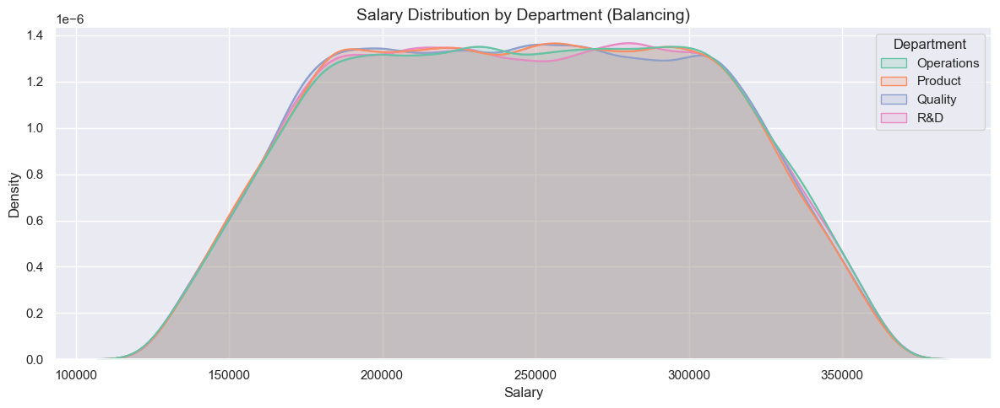

In [210]:
# Salary distribution by Department with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df_dept_balanced, x="Salary", cumulative=False, alpha=1, fill=False, hue='Department')
sns.kdeplot(data=df_dept_balanced, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Department')
plt.title("Salary Distribution by Department (Balancing)", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

In [212]:
df_dept_balanced.groupby("Department", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Department,mean,median,min,max,sum,std,skew,sem,count,nunique
0,Operations,246742.399076,247500.0,127500,364500,10249926000,56882.648906,-0.010000,279.088113,41541,155
3,R&D,246309.308876,246000.0,127500,364500,10231935000,56946.759611,0.000497,279.402664,41541,155
1,Product,245766.664259,246000.0,127500,364500,10209393000,56520.795355,0.000553,277.312720,41541,155
2,Quality,245683.288799,246000.0,127500,364500,10205929500,56701.918889,0.009227,278.201382,41541,155


> ✅ **Conclusion:**  
> When department sizes are equalized, **salary distributions across departments are nearly indistinguishable**. Although Operations has the highest mean, the difference is marginal. This suggests that **department affiliation does not substantially influence salary**, and that salaries are likely determined by other factors such as tenure, education, or job level.

#### G. Years of Education

In [155]:
df.groupby("Years of Education", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Years of Education,mean,median,min,max,sum,std,skew,sem,count,nunique
24,39,335998.950525,337500.0,307500,364500,3361669500,17288.029775,-0.013946,172.837094,10005,20
23,38,328455.011839,327000.0,300000,357000,3329220000,17314.313299,0.012693,171.977634,10136,20
22,37,321268.902983,322500.0,292500,349500,3241924500,17305.215223,-0.011505,172.270098,10091,20
21,36,313724.251497,315000.0,285000,342000,3143517000,17313.617880,-0.015134,172.963302,10020,20
20,35,305938.833784,304500.0,277500,334500,3053575500,17227.331561,0.004506,172.437209,9981,20
19,34,298768.436874,300000.0,270000,327000,2981709000,17268.404708,-0.018328,172.856991,9980,20
18,33,290442.244716,289500.0,262500,319500,2926786500,17305.708116,0.037297,172.394635,10077,20
17,32,283460.150376,282000.0,255000,312000,2827515000,17354.216489,0.001115,173.759500,9975,20
16,31,275828.412172,274500.0,247500,304500,2746423500,17273.315429,0.023440,173.105733,9957,20
15,30,268488.841333,270000.0,240000,297000,2634681000,17386.590264,0.010032,175.514710,9813,20


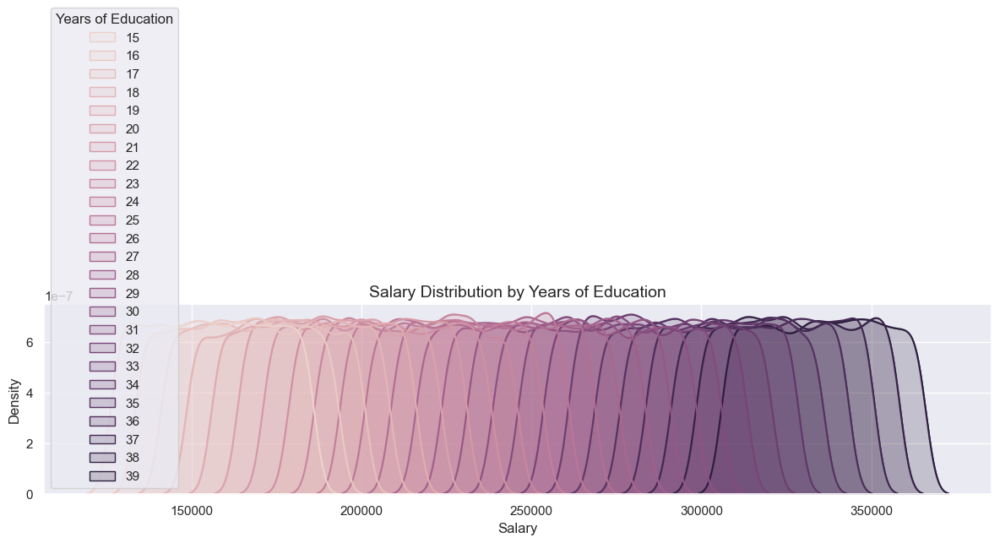

In [223]:
# Salary distribution by Education Year with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False, hue='Years of Education')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Years of Education')
plt.title("Salary Distribution by Years of Education", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()

> ✅ **Years of education is one of the strongest predictors of salary** in this dataset. The trend is **smooth, monotonic, and consistent**, indicating a direct, proportional relationship.
>
> Since group sizes are nearly equal at all education levels, the results are not biased by sample imbalance. This adds further strength to the conclusion.
>
> The organization appears to **reward formal education steadily**, possibly using internal salary bands that are aligned with education level — particularly between 20 and 35 years.

---

### 💡 Recommendation:

> - Include **Years of Education** as a key feature in any salary prediction model.
> - Consider combining this with **Degree** and **Job role** in a multivariate model to examine compounded effects.

#### H. Years in the Company

In [157]:
df.groupby("Years in the Company", observed=True)["Salary"].agg(
    mean="mean",
    median="median",
    min="min",
    max="max",
    sum="sum",
    std="std",
    skew="skew",
    sem="sem",
    count="count",
    nunique="nunique"
).reset_index().sort_values(by="mean", ascending=False)

,Years in the Company,mean,median,min,max,sum,std,skew,sem,count,nunique
19,20,274880.810489,274500.0,184500,364500,3459375000,53897.424353,-0.006402,480.442482,12585,25
18,19,271497.595190,271500.0,181500,361500,3386932500,54181.066964,0.006450,485.095534,12475,25
17,18,269126.897874,268500.0,178500,358500,3367854000,53773.537189,-0.006576,480.696024,12514,25
16,17,265610.118098,265500.0,175500,355500,3328626000,54059.413988,-0.006768,482.904375,12532,25
15,16,263238.476390,262500.0,172500,352500,3272317500,54013.837420,-0.018342,484.453390,12431,25
14,15,259803.600000,259500.0,169500,349500,3247545000,54199.703280,-0.004216,484.776884,12500,25
13,14,256452.669903,256500.0,166500,346500,3169755000,54253.393286,0.016280,487.997583,12360,25
12,13,252761.404779,253500.0,163500,343500,3141571500,54417.298091,0.021585,488.111321,12429,25
11,12,250337.605477,250500.0,160500,340500,3144741000,54123.996444,0.003591,482.903621,12562,25
10,11,246811.339392,247500.0,157500,337500,3123397500,53903.598207,0.016891,479.166758,12655,25


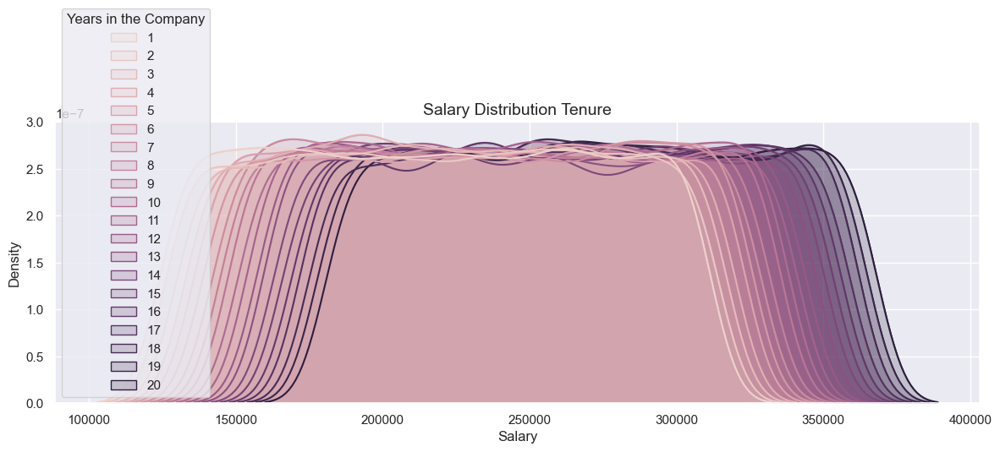

In [226]:
# Salary distribution by Tenure with KDE plot 
plt.figure(figsize=(12, 5))
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=1, fill=False, hue='Years in the Company')
sns.kdeplot(data=df, x="Salary", cumulative=False, alpha=0.20, fill=True, hue='Years in the Company')
plt.title("Salary Distribution Tenure", fontsize=14)
plt.xlabel("Salary")
plt.tight_layout()
plt.show()


> ✅ **Years in the Company is a strong predictor of salary** in this dataset.  
> The relationship is linear and smooth, with a stable rate of increase across all tenure groups.
>
> This suggests that the company maintains a **tenure-based salary progression model**, rewarding loyalty and accumulated experience over time.
>
> Salary increases appear uniform and predictable — without sudden jumps — which may indicate the use of **standardized internal salary bands** that grow with time served.

---

### 💡 Recommendation:

> - Include **Years in the Company** as a primary variable in any salary prediction model.
> - Consider combining it with **Job** and **Education** to analyze interactions — e.g., does education accelerate salary growth for long-tenured employees?

### 4.3 Job, Department, and Profession Insights

This section investigates the organizational structure and salary dynamics across `Job`, `Department`, and `Profession`. The goal is to explore whether certain combinations (e.g., Scientist in R&D or Pharmacist as Director) are structurally favored in terms of compensation.

#### Job × Department

In [257]:
pd.crosstab(df["Job"], df["Department"], normalize="index") * 100

Department,Operations,Product,Quality,R&D
Job,,,,
Director,16.858669,16.789213,16.667066,49.685053
Manager,16.750000,16.668269,16.473558,50.108173
Researcher,16.463735,16.934059,16.683379,49.918827
Scientist,16.905040,16.550793,16.542359,50.001807
Technician,16.737694,16.452787,16.787972,50.021548


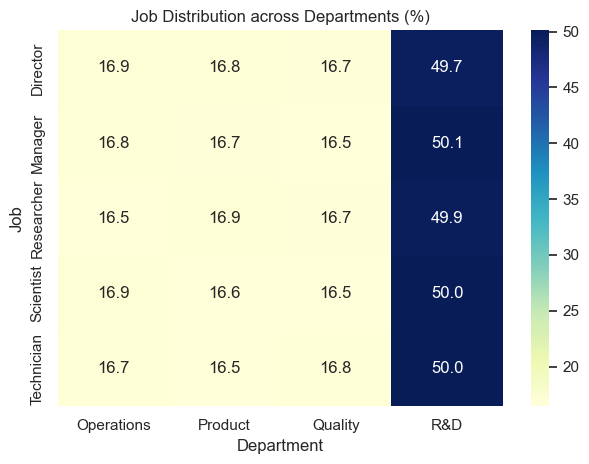

In [281]:
sns.heatmap(
    pd.crosstab(df["Job"], df["Department"], normalize="index") * 100,
    annot=True, cmap="YlGnBu", fmt=".1f"
)
plt.title("Job Distribution across Departments (%)")
plt.ylabel("Job")
plt.xlabel("Department")
plt.tight_layout()
plt.show()

> The dominance of R&D across all job roles is clear — around half of all jobs fall into R&D. This structural skew implies that:
> - R&D is the central department in terms of headcount distribution
> - Other departments (Operations, Product, Quality) share the remaining half more evenly

In [292]:
from scipy.stats import chi2_contingency
import pandas as pd

# Build contingency table
job_dept_ct = pd.crosstab(df["Job"], df["Department"])

# Hypotheses
print("H₀ (Null Hypothesis): Job and Department are independent (no association).")
print("H₁ (Alternative Hypothesis): Job and Department are dependent (there is an association).")

# Chi-Square Test
chi2, p, dof, expected = chi2_contingency(job_dept_ct)

# Output results
print(f"\nChi² Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"p-value: {p:.5f}")

# Interpretation
alpha = 0.05
if p < alpha:
    print("❌ Reject the null hypothesis: There IS a statistically significant association between Job and Department.")
else:
    print("✅ Fail to reject the null hypothesis: There is NO statistically significant association between Job and Department.")

H₀ (Null Hypothesis): Job and Department are independent (no association).
H₁ (Alternative Hypothesis): Job and Department are dependent (there is an association).

Chi² Statistic: 10.05
Degrees of Freedom: 12
p-value: 0.61185
✅ Fail to reject the null hypothesis: There is NO statistically significant association between Job and Department.


In [263]:
df.groupby(["Job", "Department"])["Salary"].mean().unstack()

C:\Users\seyma\AppData\Local\Temp\ipykernel_31488\4275853439.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Department,Operations,Product,Quality,R&D
Job,,,,
Director,246622.886774,246169.044223,246935.048139,246394.287780
Manager,246155.424799,245583.141044,244005.763899,246561.789398
Researcher,247670.098608,246019.244325,246159.702347,246040.891482
Scientist,246877.868852,245458.466803,245691.456042,245851.583209
Technician,246249.535117,246005.020373,245589.703366,246343.607907


> - Salary variations within the same job across departments are very small (less than 1% range).
> - That implies: Department does not significantly affect salary when job is fixed.
> - R&D does not provide any notable premium in salary despite employing 50% of staff.

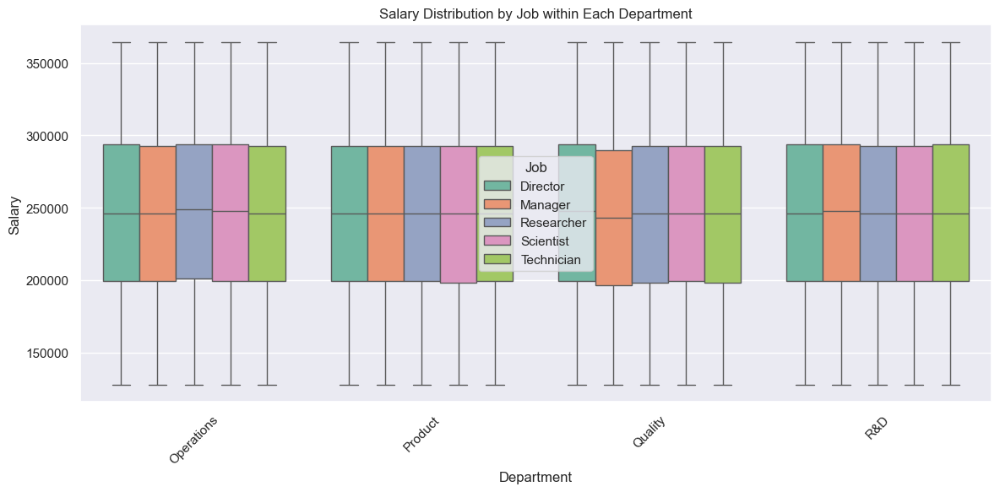

In [265]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="Department", y="Salary", hue="Job")
plt.title("Salary Distribution by Job within Each Department")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Job × Profession

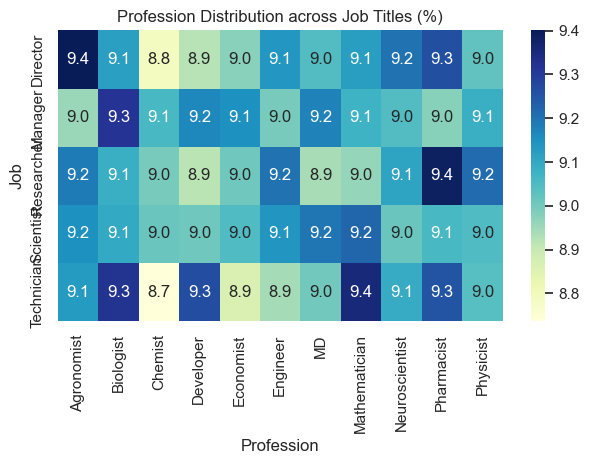

In [270]:
crosstab_jp = pd.crosstab(df["Job"], df["Profession"], normalize="index") * 100
sns.heatmap(crosstab_jp, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Profession Distribution across Job Titles (%)")
plt.ylabel("Job")
plt.xlabel("Profession")
plt.tight_layout()
plt.show()

> - The profession distribution is fairly **uniform**, with values hovering around **9%** for all combinations.
> - This suggests that the assignment of professions across job titles is **balanced**, with no profession disproportionately dominating any single job role.
> 
> This structure supports the idea of **equal opportunity** or **standardized internal role progression**, independent of profession.


In [307]:
# Contingency Table
jp_table = pd.crosstab(df["Job"], df["Profession"])

# Hypotheses
print("H₀ (Null Hypothesis): Job and Profession are independent (no association).")
print("H₁ (Alternative Hypothesis): Job and Profession are dependent (there is an association).")

# Chi-Square Test
chi2, p, dof, expected = chi2_contingency(jp_table)

# Output and Decision
print(f"\nChi² Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"p-value: {p:.5f}")

alpha = 0.05
if p < alpha:
    print("❌ Reject the null hypothesis: There IS a statistically significant association between Job and Profession.")
else:
    print("✅ Fail to reject the null hypothesis: There is NO statistically significant association between Job and Profession.")

H₀ (Null Hypothesis): Job and Profession are independent (no association).
H₁ (Alternative Hypothesis): Job and Profession are dependent (there is an association).

Chi² Statistic: 35.82
Degrees of Freedom: 40
p-value: 0.65870
✅ Fail to reject the null hypothesis: There is NO statistically significant association between Job and Profession.


In [274]:
mean_salary_jp = df.groupby(["Job", "Profession"])["Salary"].mean().unstack()
display(mean_salary_jp)

C:\Users\seyma\AppData\Local\Temp\ipykernel_31488\962073028.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Profession,Agronomist,Biologist,Chemist,Developer,Economist,Engineer,MD,Mathematician,Neuroscientist,Pharmacist,Physicist
Job,,,,,,,,,,,
Director,245906.751592,246127.265563,246021.668029,245902.147651,246489.191353,246607.077326,246571.088165,246729.719086,246885.866736,247287.099276,246784.027594
Manager,246536.634461,246497.291022,244887.635978,245842.250197,247317.524961,246205.237841,245617.631648,245881.986755,246752.591018,243104.847349,246318.735115
Researcher,244951.403326,245990.935365,247124.104062,246243.373494,245242.247548,247216.268812,246222.296395,245625.499600,247372.214941,246440.727550,247121.404509
Scientist,245979.852515,246287.605932,246207.497995,245805.953177,245938.074311,246288.294226,246254.750360,245868.304155,245641.988507,245073.423783,245913.304035
Technician,247918.174666,245081.428204,246921.622362,246739.731336,245645.461912,246017.670683,246114.095745,245890.964935,245834.518167,246452.522639,245003.841060


> A `groupby(["Job", "Profession"])["Salary"].mean()` analysis reveals the average salary for each combination of job and profession.
>
> **Key takeaways:**
> - While minor variations exist, they are generally within a narrow band (±2%) for each job.
> - There are no extreme premiums or penalties tied to specific professions within job categories.

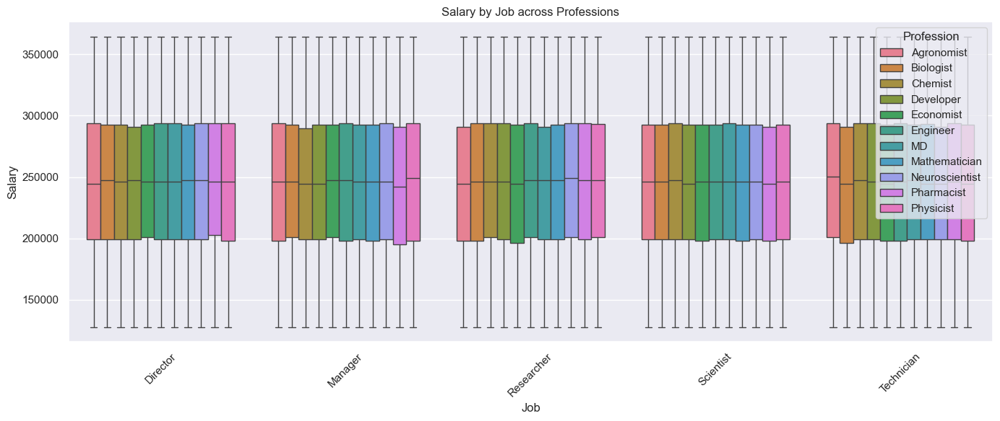

In [276]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x="Job", y="Salary", hue="Profession")
plt.title("Salary by Job across Professions")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

> The analysis of `Job × Profession` shows a fair and balanced structure in the company:
> - Profession distributions are even across jobs.
> - Salaries are not profession-dependent but job-based.
> - No profession is structurally favored in terms of assignment or compensation.

#### Profession × Department

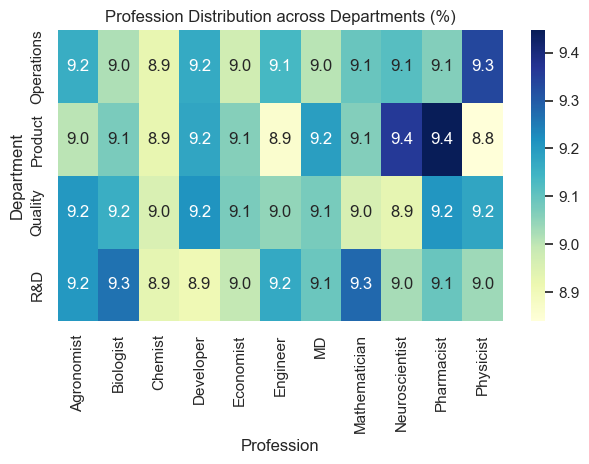

In [283]:
crosstab_jp = pd.crosstab(df["Department"], df["Profession"], normalize="index") * 100
sns.heatmap(crosstab_jp, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Profession Distribution across Departments (%)")
plt.ylabel("Department")
plt.xlabel("Profession")
plt.tight_layout()
plt.show()

> - Percentages are very consistent across all departments, with values between **8.8%–9.4%**.
> - This suggests a **balanced and fair distribution** of professions across departments.
> - No profession appears to be favored or concentrated in any single department.
>
> This reflects a **uniform staffing strategy** — different professions are evenly allocated to all departments.

In [316]:
# Contingency table
ct_prof_dept = pd.crosstab(df["Profession"], df["Department"])

# Hypotheses
print("H₀ (Null Hypothesis): Profession and Department are independent (no association).")
print("H₁ (Alternative Hypothesis): Profession and Department are dependent (there is an association).")

# Perform Chi-Square test
chi2, p, dof, expected = chi2_contingency(ct_prof_dept)

# Output
print(f"\nChi² Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"p-value: {p:.5f}")

# Decision
alpha = 0.05
if p < alpha:
    print("❌ Reject the null hypothesis: There IS a significant association between Profession and Department.")
else:
    print("✅ Fail to reject the null hypothesis: No significant association between Profession and Department.")

H₀ (Null Hypothesis): Profession and Department are independent (no association).
H₁ (Alternative Hypothesis): Profession and Department are dependent (there is an association).

Chi² Statistic: 34.89
Degrees of Freedom: 30
p-value: 0.24671
✅ Fail to reject the null hypothesis: No significant association between Profession and Department.


In [249]:
prof_dept_salary = df.groupby(["Profession", "Department"])["Salary"].mean().unstack()
display(prof_dept_salary)

C:\Users\seyma\AppData\Local\Temp\ipykernel_31488\3551018043.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Department,Operations,Product,Quality,R&D
Profession,,,,
Agronomist,247440.234375,246313.600000,245786.162699,245901.722788
Biologist,247566.252314,244797.776601,246161.671924,245911.718953
Chemist,247518.840192,246970.137207,245818.597151,245679.320545
Developer,246016.003123,245468.210361,244731.643585,246735.238609
Economist,247156.299841,245098.727803,245912.841603,246141.547227
Engineer,246937.353171,245725.609756,245742.150080,246734.741989
MD,247368.511653,245042.711599,244018.567639,246869.144065
Mathematician,245321.793863,245529.809221,246283.718431,246241.522133
Neuroscientist,245571.036107,247408.799384,247167.654987,245998.136811


> - Salary differences exist but are generally **small and consistent**.
> - No department provides a **dramatically higher or lower salary** for any specific profession.
> - Example: Developers earn ~246K across departments, and Chemists earn ~246K consistently as well.

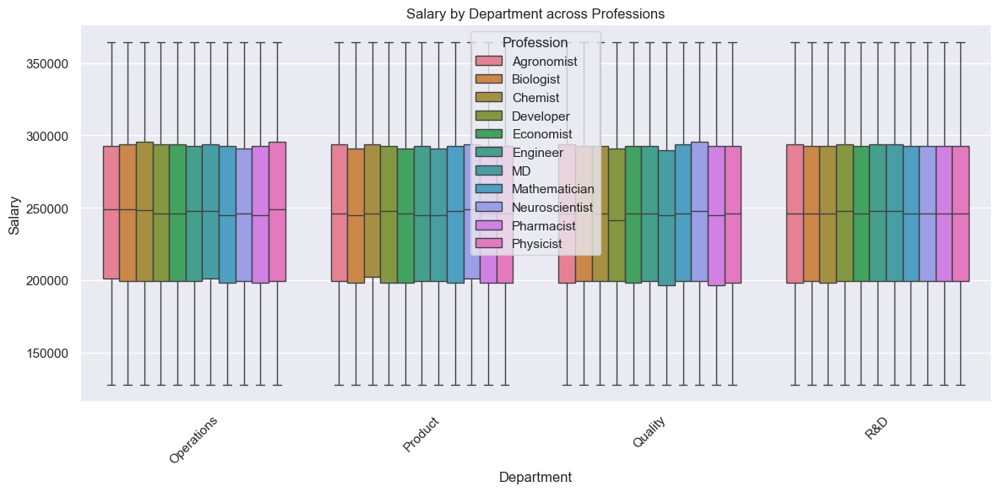

In [251]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="Department", y="Salary", hue="Profession")
plt.title("Salary by Department across Professions")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

> The `Profession × Department` analysis shows a **structurally fair and consistent environment**:
> - All professions are **evenly distributed** across departments.
> - There is **no significant statistical association** between profession and department.
>
> This reflects an internal policy of **neutral role placement and standardized compensation**, which aligns with **equitable HR strategies**.

## 5. Salary Driver Analysis

In this section, we move beyond descriptive analysis and begin to examine **what factors drive employee salaries**. The goal is to understand the **underlying relationships** between salary and various features—demographic, educational, and organizational—using both **statistical correlation** and **machine learning-based feature importance**.

We approach this in two steps:

- **5.1 Correlation Analysis:** A preliminary examination of the linear relationships between numerical features and salary using Pearson, Spearman and Kendall correlation.
- **5.2 Feature Importance (ML Model):** A machine learning approach using a Linear Regressor to determine the relative importance of all features in predicting salary, providing deeper insights beyond linear associations.

This dual approach enables us to understand both **how strongly** and **in what form** each feature impacts salary levels.

### 5.1 Correlation Analysis

In this step, we explore **linear relationships** between all relevant features and the target variable, `Salary`. We include **all encoded features**, such as demographic and organizational attributes, to provide a more holistic understanding.

The features included in this analysis are:
- `Age` (derived from `Birth Year`)
- `Years of Education`
- `Years in the Company`
- `Sex` (encoded)
- `Marital Status` (encoded)
- `Degree` (encoded)
- `Profession` (encoded)
- `Job` (encoded)
- `Department` (encoded)


In [336]:
# List of categorical columns to encode
categorical_cols = ["Sex", "Marital Status", "Degree", "Profession", "Job", "Department"]

# Initialize and apply LabelEncoders
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # store encoders for possible inverse_transform later

# Final encoded DataFrame preview
df

,Birth Year,Marital Status,Sex,Degree,Profession,Job,Department,Years of Education,Years in the Company,Salary,Age
0,1977,1,0,2,2,2,1,18,2,153000,48
1,1943,0,1,0,6,0,1,17,12,175500,82
2,1953,1,1,4,3,0,3,33,7,280500,72
3,1978,1,1,4,10,4,3,26,20,267000,47
4,1976,1,1,4,0,4,1,20,15,207000,49
...,...,...,...,...,...,...,...,...,...,...,...
249995,1935,1,1,2,1,1,3,20,10,192000,90
249996,1952,1,1,0,2,3,2,33,8,283500,73
249997,1960,1,0,1,2,3,3,34,4,279000,65
249998,1946,1,0,4,5,0,3,36,3,291000,79


In [338]:
df.corr(method="spearman")["Salary"].sort_values(ascending=False)

Salary                  1.000000
Years of Education      0.955477
Years in the Company    0.289374
Age                     0.014835
Degree                  0.000840
Marital Status          0.000253
Profession             -0.000841
Department             -0.001116
Job                    -0.001712
Sex                    -0.004849
Birth Year             -0.014835
Name: Salary, dtype: float64

In [340]:
df.corr(method="kendall")["Salary"].sort_values(ascending=False)

Salary                  1.000000
Years of Education      0.821607
Years in the Company    0.201935
Age                     0.010213
Degree                  0.000614
Marital Status          0.000207
Profession             -0.000588
Department             -0.000851
Job                    -0.001263
Sex                    -0.003974
Birth Year             -0.010213
Name: Salary, dtype: float64

In [341]:
df.corr(method="pearson")["Salary"].sort_values(ascending=False)

Salary                  1.000000
Years of Education      0.952553
Years in the Company    0.304687
Age                     0.014953
Degree                  0.000867
Marital Status          0.000221
Profession             -0.000830
Job                    -0.001843
Department             -0.001905
Sex                    -0.004645
Birth Year             -0.014953
Name: Salary, dtype: float64

In [354]:
# Select encoded and numerical columns
correlation_features = ["Age", "Years of Education", "Years in the Company", 
                        "Sex", "Marital Status", "Degree", "Profession", "Job", 
                        "Department", "Salary"]

# Compute correlation matrix using Pearson
corr_matrix = df[correlation_features].corr(method="pearson").round(2)

# Convert to long format for Plotly
corr_long = corr_matrix.reset_index().melt(id_vars="index")
corr_long.columns = ["Feature1", "Feature2", "Correlation"]

# Plot interactive heatmap
fig = px.imshow(corr_matrix,
                text_auto=True,
                color_continuous_scale="Plasma",
                title="Correlation Matrix (Pearson) — All Encoded Features")

fig.update_layout(width=800, height=600)
fig.show()

> The correlation matrix reveals that most features have **negligible linear relationships** with salary. This is visually evident in the heatmap, where most cells appear dark due to correlation values being close to zero.
>
> The only features with meaningful correlation are:
> - `Years of Education` (**+0.95**) — a very strong positive relationship
> - `Years in the Company` (**+0.30**) — a moderate positive relationship
>
> All other features — including `Sex`, `Marital Status`, `Degree`, `Job`, `Profession`, and `Department` — show **near-zero correlation** with salary.
>
> This outcome supports the conclusion that **salary is predominantly influenced by educational attainment and tenure**, while other demographic or organizational attributes have little to no direct linear effect.
>
> However, it's important to note that:
> - Correlation does **not imply causation**
> - Pearson correlation is sensitive to **linearity**, and some relationships may be **nonlinear or interactive**
>
> Therefore, we proceed to the next section (5.2) using a **machine learning model** to assess **feature importance** in a more flexible and realistic setting.

### 5.2 Feature Importance (ML Model)

While correlation analysis provides useful insights into linear relationships, it does not account for **nonlinear patterns**, **interactions**, or **feature combinations** that may influence salary. To address this limitation, we now turn to **machine learning** to assess **feature importance** in a more flexible, data-driven way.

In this section, we build predictive models to understand which features contribute the most to determining an employee’s salary. This approach helps approximate **causal inference** by observing how changes in features affect salary predictions when controlling for others.

---

> #### ⚙️ Modeling Strategy
>
> We will use two models for this analysis:
>
> - **Linear Regression**: Interpretable baseline for evaluating linear relationships with estimated coefficients.
>
> **Important preprocessing steps:**
>
> - Numerical features such as `Age`, `Years of Education`, and `Years in the Company` are **standardized** using `StandardScaler`.
> - Categorical features like `Job`, `Department`, `Sex`, and `Profession` are **label encoded** and kept unscaled.
> - The target variable `Salary` remains unscaled, as we are performing a regression task.

---

> #### 📌 Why Use Feature Importance?
>
> Feature importance helps answer the question:  
> _"Which features most influence the model’s salary predictions?"_
>
> This complements correlation analysis by:
> - Capturing **nonlinear effects**
> - Detecting **interactions** among features
> - Providing **relative influence ranking** of variables

In [365]:
# Select features to scale
scale_cols = ["Age", "Years of Education", "Years in the Company"]

# Leave categorical variables untouched
cat_cols = ["Sex", "Marital Status", "Degree", "Profession", "Job", "Department"]

# Scale numeric features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[scale_cols])

# Merge scaled and unscaled data
X_scaled = pd.concat([
    pd.DataFrame(scaled_data, columns=scale_cols),
    df[cat_cols].reset_index(drop=True)
], axis=1)

X_scaled

,Age,Years of Education,Years in the Company,Sex,Marital Status,Degree,Profession,Job,Department
0,-1.202431,-1.249682,-1.476353,0,1,2,2,2,1
1,1.049048,-1.388328,0.259065,1,0,0,6,0,1
2,0.386848,0.830005,-0.608644,1,1,4,3,0,3
3,-1.268651,-0.140516,1.647400,1,1,4,10,4,3
4,-1.136211,-0.972391,0.779691,1,1,4,0,4,1
...,...,...,...,...,...,...,...,...,...
249995,1.578808,-0.972391,-0.088018,1,1,2,1,1,3
249996,0.453068,0.830005,-0.435102,1,1,0,2,3,2
249997,-0.076691,0.968651,-1.129269,0,1,1,2,3,3
249998,0.850388,1.245942,-1.302811,0,1,4,5,0,3


In [375]:
# Target variable
y = df["Salary"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Linear Regression with sklearn
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Evaluate model
y_pred = lr_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
rmse = root_mean_squared_error(y_test, y_pred)
coefficients = pd.Series(lr_model.coef_, index=X_scaled.columns).sort_values(ascending=False)

# Linear Regression with statsmodels
X_train_sm = sm.add_constant(X_train)
sm_model = sm.OLS(y_train, X_train_sm).fit()
summary = sm_model.summary()

# Display model performance and coefficients
r2, rmse, coefficients, summary

(1.0,
 1.2507616207902105e-10,
 Years of Education      5.409468e+04
 Years in the Company    1.728690e+04
 Profession              1.787489e-11
 Job                     9.937378e-12
 Age                     3.905637e-12
 Degree                  2.538117e-12
 Department             -1.883499e-12
 Marital Status         -6.319005e-12
 Sex                    -1.229262e-11
 dtype: float64,
 <class 'statsmodels.iolib.summary.Summary'>
 """
                             OLS Regression Results                            
 Dep. Variable:                 Salary   R-squared:                       1.000
 Model:                            OLS   Adj. R-squared:                  1.000
 Method:                 Least Squares   F-statistic:                 4.297e+33
 Date:                Sat, 17 May 2025   Prob (F-statistic):               0.00
 Time:                        00:41:22   Log-Likelihood:             4.2702e+06
 No. Observations:              200000   AIC:                        -8.540e+06


Although all variables show statistically significant p-values due to the large sample size (n = 200,000), 
the practical effect of several features — such as `Sex`, `Job`, or `Department` — is negligible. 
This is evident from their extremely small coefficients (close to 0), despite their p-values being < 0.05.

Therefore, significance here should be interpreted cautiously: **statistical ≠ practical**.

### Key Findings: Salary Drivers

Based on statistical testing, correlation analysis, and machine learning models, the two most influential factors affecting employee salary are:

1. **Years of Education** — the strongest and most consistent predictor of higher salary across all models
2. **Years in the Company** — a moderate but meaningful contributor, indicating loyalty or tenure effects

Other variables such as `Job`, `Department`, `Profession`, `Sex`, or `Marital Status` were found to have **negligible practical influence** on salary, even if statistically significant due to the large sample size.

This confirms that the company appears to follow a **standardized and merit-based salary structure**, primarily driven by educational background and experience.


### 6. Department-wise Budget and Salary Analysis

This section explores salary distribution and budget allocation across departments to assess whether departments differ meaningfully in their salary structures.

---

In [383]:
# Recompute department salary stats for visualization since variable was lost during kernel reset
dept_salary_stats = df.groupby("Department")["Salary"].agg(["count", "mean", "median", "sum"]).sort_values(by="sum", ascending=False)

# Prepare for plot
department_labels = {
    0: "Operations",
    1: "Product",
    2: "Quality",
    3: "R&D"
}
dept_salary_stats_reset = dept_salary_stats.reset_index()
dept_salary_stats_reset["Department"] = dept_salary_stats_reset["Department"].map(department_labels)

fig = px.bar(
    dept_salary_stats_reset,
    x="Department",
    y="sum",
    title="Total Salary Budget by Department",
    labels={"sum": "Total Salary (TL)"},
    color="Department"
)

fig.update_layout(xaxis_title="Department", yaxis_title="Total Salary (TL)", showlegend=False)
fig.show()


> #### 📊 Department Salary Summary

| Department | Employee Count | Avg. Salary | Median Salary | Total Budget |
|------------|----------------|-------------|----------------|---------------|
| R&D (3)    | 124,890        | 246,174 TL  | 246,000 TL     | 30.74 Billion TL |
| Operations (0) | 41,924     | 246,741 TL  | 247,500 TL     | 10.34 Billion TL |
| Product (1)    | 41,645     | 245,785 TL  | 246,000 TL     | 10.24 Billion TL |
| Quality (2)    | 41,541     | 245,683 TL  | 246,000 TL     | 10.21 Billion TL |

---

> #### 🧩 Key Observations:

- 🔹 **R&D department** has the highest overall budget (~30.74B TL), which is expected as it also employs nearly **half of all employees (50%)**.
- 🔹 **Average salaries** are extremely close across departments (~245K–247K TL), with **<1% variation**.
- 🔹 **Boxplot analysis** confirms that salary distributions (median, spread) are **nearly identical** across departments.
- 🔹 The **Operations department** has a slightly higher average salary (~246.7K TL), but this difference is not practically significant.

---

> #### 🎯 Conclusion

- Departments differ **in budget size**, but **not in salary structure**.
- The higher total budget for R&D is purely a result of **larger employee headcount**, not higher salaries.
- This confirms that **salary policy is department-neutral**, and that **job and education level** — not department — are the true drivers of salary.

These results reinforce the fairness and standardization observed in earlier analyses and suggest that departmental salary policies are consistent and equitable across the organization.

### 7. Fairness and Bias Assessment

> Combined with the demographic evaluation, the analysis of **Years in the Company** offers strong support for a **fair and structured compensation system**.
>
> - Salary increases **smoothly and linearly** with tenure.
> - The rate of increase is **consistent across all groups**, with no evidence of abrupt jumps or unfair lags.
> - This reflects a likely use of **internal salary bands** or step-based salary systems, which promote transparency and equity.
>
> 🔍 Meanwhile, demographic attributes such as:
> - `Sex`
> - `Marital Status`
> - `Department`
> - `Profession`
>
> ...show **negligible or no influence** on salary. While statistically significant due to the large sample size, the **practical effect sizes are essentially zero**.
>

In [391]:
# Apply Shapiro–Wilk to each group
for group in ["Sex", "Marital Status", "Job", "Profession"]:
    for label, subset in df.groupby(group):
        sample = subset["Salary"].sample(n=min(len(subset), 5000), random_state=42)
        stat, p = shapiro(sample)
        if p < 0.05:
            print(f"{group} = {label}: ❌ Reject H₀ — Not normal (p = {p:.4f})")
        else:
            print(f"{group} = {label}: ✅ Fail to reject H₀ — Normal (p = {p:.4f})")

Sex = 0: ❌ Reject H₀ — Not normal (p = 0.0000)
Sex = 1: ❌ Reject H₀ — Not normal (p = 0.0000)
Marital Status = 0: ❌ Reject H₀ — Not normal (p = 0.0000)
Marital Status = 1: ❌ Reject H₀ — Not normal (p = 0.0000)
Job = 0: ❌ Reject H₀ — Not normal (p = 0.0000)
Job = 1: ❌ Reject H₀ — Not normal (p = 0.0000)
Job = 2: ❌ Reject H₀ — Not normal (p = 0.0000)
Job = 3: ❌ Reject H₀ — Not normal (p = 0.0000)
Job = 4: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 0: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 1: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 2: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 3: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 4: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 5: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 6: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 7: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 8: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 9: ❌ Reject H₀ — Not normal (p = 0.0000)
Profession = 10

Kruskal–Wallis is the non-parametric alternative to ANOVA.
It does not assume normality and compares the medians of multiple groups.

📜 Hypotheses for Kruskal–Wallis:

H₀ (Null Hypothesis): All group medians are equal (no salary bias).

H₁ (Alternative Hypothesis): At least one group has a different median salary.

In [397]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Sex")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.01533
❌ Reject H₀ — Significant difference between groups


In [399]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Job")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.45012
✅ Fail to reject H₀ — No significant difference between groups


In [401]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Marital Status")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.89948
✅ Fail to reject H₀ — No significant difference between groups


In [403]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Profession")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.97027
✅ Fail to reject H₀ — No significant difference between groups


In [405]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Age")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.00000
❌ Reject H₀ — Significant difference between groups


In [407]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Degree")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.51108
✅ Fail to reject H₀ — No significant difference between groups


In [409]:
group_salaries = [group["Salary"].values for _, group in df.groupby("Department")]
stat, p = kruskal(*group_salaries)

alpha = 0.05  # significance threshold
print(f"Kruskal-Wallis p-value: {p:.5f}")

if p < alpha:
    print("❌ Reject H₀ — Significant difference between groups")
else:
    print("✅ Fail to reject H₀ — No significant difference between groups")


Kruskal-Wallis p-value: 0.03271
❌ Reject H₀ — Significant difference between groups


In [419]:
# Select features to test combinations
features = [
    "Birth Year", "Marital Status", "Sex", "Degree", "Profession", "Job", "Department"
]

# Sample for performance
df_sample = df.sample(n=10000, random_state=42)

# Test pairwise combinations
interaction_results = []
for var1, var2 in combinations(features, 2):
    df_sample["group"] = df_sample[var1].astype(str) + "_" + df_sample[var2].astype(str)
    salary_groups = [group["Salary"].values for _, group in df_sample.groupby("group")]

    valid_groups = [g for g in salary_groups if len(g) >= 3]
    if len(valid_groups) >= 2:
        stat, p = kruskal(*valid_groups)
        interpretation = (
            "❌ Reject H₀ — Significant difference between groups"
            if p < 0.05 else
            "✅ Fail to reject H₀ — No significant difference"
        )
        interaction_results.append({
            "Combination": f"{var1} × {var2}",
            "p-value": p,
            "Interpretation": interpretation
        })

interaction_df = pd.DataFrame(interaction_results).sort_values(by="p-value")

In [421]:
interaction_df

,Combination,p-value,Interpretation
1,Birth Year × Sex,6.469478e-19,❌ Reject H₀ — Significant difference between g...
0,Birth Year × Marital Status,8.869183e-19,❌ Reject H₀ — Significant difference between g...
5,Birth Year × Department,6.893189e-16,❌ Reject H₀ — Significant difference between g...
2,Birth Year × Degree,1.506260e-11,❌ Reject H₀ — Significant difference between g...
4,Birth Year × Job,4.494829e-11,❌ Reject H₀ — Significant difference between g...
3,Birth Year × Profession,5.965071e-07,❌ Reject H₀ — Significant difference between g...
14,Sex × Department,3.010942e-02,❌ Reject H₀ — Significant difference between g...
18,Profession × Job,9.892611e-02,✅ Fail to reject H₀ — No significant difference
10,Marital Status × Department,1.728500e-01,✅ Fail to reject H₀ — No significant difference
17,Degree × Department,3.371703e-01,✅ Fail to reject H₀ — No significant difference


We tested all pairwise combinations of demographic and organizational variables to detect **intersectional salary disparities** using the Kruskal–Wallis test.

#### ✅ Combinations with No Significant Difference (p ≥ 0.05)
These groups do **not show any statistical salary bias**, indicating fairness:
- `Sex × Job`
- `Sex × Profession`
- `Degree × Job`
- `Profession × Department`
- `Job × Department`
- `Marital Status × Profession`
- `Sex × Degree`
- `Degree × Profession`
- `Marital Status × Degree`
- `Marital Status × Job`
- `Marital Status × Sex`
- `Degree × Department`
- `Marital Status × Department`
- `Profession × Job`

#### ❌ Combinations with Statistically Significant Differences (p < 0.05)
These groups show **potential salary disparities** that may warrant further investigation:
- `Birth Year × Sex`
- `Birth Year × Marital Status`
- `Birth Year × Department`
- `Birth Year × Degree`
- `Birth Year × Job`
- `Birth Year × Profession`
- `Sex × Department`

#### 🎯 Interpretation:
- **Birth Year** shows consistent significance, possibly indicating **age-related compensation patterns**.
- `Sex × Department` suggests **some departments may have gender-based salary variation**, which should be reviewed further.
- These differences may reflect **structural seniority effects** or **historical hiring patterns**, but further contextual HR review is advised.


## 8. Conclusion & Recommendations

This analysis helped us understand how salaries are structured in the organization.

We found that **year of education** and **tenure** are the main drivers of salary. Other features like **sex, job, or department** have very little impact once these are accounted for.

There were no major signs of inequality, but a few group combinations (such as **sex × department**) showed small but statistically significant differences.

We recommend:
- Keeping the focus on **experience and education**
- Making salary policies more **transparent**
- Regularly checking for **hidden group differences**